In [1]:
import csv
import pandas as pd
import xarray as xr
import folium
import os
from folium.plugins import MousePosition
from folium import FeatureGroup, LayerControl
import json
import numpy as np
import branca
from folium import plugins
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import geojsoncontour
import scipy as sp
import scipy.ndimage

import datetime
from sklearn import preprocessing
from plotly import graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [2]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
#altimetry_folder = os.getcwd() + "\\dataset-satellite-sea-level-global-cebb521b-ece5-4fe1-8ac5-d03ea8026e54"


### Process & Merge Altimetry Data

Data from https://cds.climate.copernicus.eu/cdsapp#!/dataset/satellite-sea-level-global?tab=overview

In [3]:
altimetry_folder = r"D:\PACIOOS\altimetry\dataset-satellite-sea-level-global-all"

In [200]:
os.listdir("D:\PACIOOS")

['.ipynb_checkpoints',
 'altimetry',
 'dataset-satellite-sea-level-global-cebb521b-ece5-4fe1-8ac5-d03ea8026e54',
 'palau.html',
 'PALAU.ipynb',
 'PALAUMAP.ipynb',
 'PLW_000001_Rain.csv',
 'PLW_000001_Rain_daily.csv',
 'Untitled.ipynb']

In [217]:
masterxr = None
for filename in os.listdir(altimetry_folder):
    f = os.path.join(altimetry_folder, filename)
    if masterxr is None:
        xa1 = xr.open_dataset(f)
        xa1 = xa1.adt
        xa1 = xa1.to_dataframe()
        xa1 = xa1[~xa1["adt"].isnull()]
        xa1 = xa1.reset_index()
        xa1 = xa1[(xa1["latitude"]>= 1.6214)&
                                (xa1["latitude"]<=11.5587)&(xa1["longitude"]<=136.9541)&
                                (xa1["longitude"]>=129.5088)]
        masterxr = xa1
        del xa1
    else:
        xa1 = xr.open_dataset(f)
        xa1 = xa1.adt
        xa1 = xa1.to_dataframe()
        xa1 = xa1[~xa1["adt"].isnull()]
        xa1 = xa1.reset_index()
        xa1 = xa1[(xa1["latitude"]>= 1.6214)&
                                (xa1["latitude"]<=11.5587)&(xa1["longitude"]<=136.9541)&
                                (xa1["longitude"]>=129.5088)]
        masterxr = pd.concat([masterxr,xa1])
        del xa1

In [218]:
masterxr.to_pickle("mastertest.pkl")

In [ ]:
masterxr['time'].unique()

### Altimetry Folium and HTML Line Plots Legacy Code

In [3]:
masterxr = pd.read_pickle("mastertest.pkl")

In [11]:
mdf = masterxr.copy(deep = True)
#mdf['MA48'] = mdf.adt.rolling(48).mean()
mdf['datetimeint'] = pd.to_datetime(mdf['time']).astype(np.int64)
mdf['datetime'] = pd.to_datetime(mdf['time'])



hover_text = []
for index, row in mdf.iterrows():
    hover_text.append(('<b>{latitude}, {longitude}</b><br><br>'+
                      'Snapshot Date: {time}<br>'+
                      'Sea surface height: {adt}<br>'
                       ).format(
                       latitude=row['latitude'],
                       longitude=row['longitude'],
                       adt=row['adt'],
                       time=row['time']
                      ))
mdf['text'] = hover_text

mdf.to_pickle("mastertest_html.pkl")
print("Pickled html")

figs = {}
coordinatelist=[]
htmllist = []
coordinates = mdf[['latitude','longitude']]
coordinates = coordinates.drop_duplicates()

for i, co in enumerate(coordinates.values):
    coordinatelist.append(co)
    htmllist.append('fig' + str(i) +'.html')
    df_coordinate = mdf[(mdf["latitude"] == co[0])&
                                (mdf["longitude"]== co[1])]
    
    x_train= df_coordinate.datetimeint.values.reshape(-1, 1)
    model = LinearRegression().fit(x_train, df_coordinate.adt)
    y_hat = model.predict(x_train)
    y_hat1 = sm.nonparametric.lowess(df_coordinate.adt.values, df_coordinate.datetimeint.values) #default frac=2/3

    fig = make_subplots(specs=[[{"secondary_y":True}]])

    fig.add_trace(                           
        go.Scatter(
        x=df_coordinate['datetime'],
        y=df_coordinate['adt'],
        name="ADT",
        mode='lines',
        text=df_coordinate['text'],               
        hoverinfo='text',                   
        line = dict(color='firebrick', width=3)
         ),
        secondary_y=True) 

    fig.add_trace(go.Scatter(x=df_coordinate.datetime, y=y_hat,name = "LR", mode='lines',line=dict(color='blue', width=2))) #Trendline

    fig.add_trace(go.Scatter(x=df_coordinate.datetime, y=y_hat1[:,1],name = "LOWESS", mode='lines',line=dict(color='purple', width=2)))

    fig.update_layout(hoverlabel_bgcolor='#DAEEED',  
                 title_text="Sea Level Trend: " + str(co[0]) + ", " + str(co[1]), 
                 title_font_family="Times New Roman",
                 title_font_size = 20,
                 title_font_color="darkblue", 
                 title_x=0.5, 
                 xaxis=dict(
                        tickangle = 270,
                        showgrid = True,
                        zeroline = True,
                        showline = True,
                        #showticklabels = True,
                        dtick="M12", 
                        tickformat="%Y-%m-%d"
                        ),
                 legend = dict(orientation = 'h', xanchor = "center", x = 0.72, y= 1), 
                 yaxis_title='ADT (m)')
    fig.update_xaxes(
    rangeslider_visible=True
    )
    figs['fig'+str(i)] = fig
    fig.write_html('./figures/altimetry_figures_all/fig'+str(i)+".html")
    print("Wrote " + './figures/altimetry_figures_all/fig'+str(i)+".html")

df1=pd.DataFrame(coordinatelist,columns =['latitude','longitude'])
df2=pd.DataFrame(htmllist,columns =['html_file'])
df3=pd.concat([df1, df2], axis=1)
df3.to_pickle('./html_list')

C:\Users\ligna\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: casting datetime64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  This is separate from the ipykernel package so we can avoid doing imports until


Pickled html
Wrote ./figures/altimetry_figures_all/fig0.html
Wrote ./figures/altimetry_figures_all/fig1.html
Wrote ./figures/altimetry_figures_all/fig2.html
Wrote ./figures/altimetry_figures_all/fig3.html
Wrote ./figures/altimetry_figures_all/fig4.html
Wrote ./figures/altimetry_figures_all/fig5.html
Wrote ./figures/altimetry_figures_all/fig6.html
Wrote ./figures/altimetry_figures_all/fig7.html
Wrote ./figures/altimetry_figures_all/fig8.html
Wrote ./figures/altimetry_figures_all/fig9.html
Wrote ./figures/altimetry_figures_all/fig10.html
Wrote ./figures/altimetry_figures_all/fig11.html
Wrote ./figures/altimetry_figures_all/fig12.html
Wrote ./figures/altimetry_figures_all/fig13.html
Wrote ./figures/altimetry_figures_all/fig14.html
Wrote ./figures/altimetry_figures_all/fig15.html
Wrote ./figures/altimetry_figures_all/fig16.html
Wrote ./figures/altimetry_figures_all/fig17.html
Wrote ./figures/altimetry_figures_all/fig18.html
Wrote ./figures/altimetry_figures_all/fig19.html
Wrote ./figures/a

Wrote ./figures/altimetry_figures_all/fig166.html
Wrote ./figures/altimetry_figures_all/fig167.html
Wrote ./figures/altimetry_figures_all/fig168.html
Wrote ./figures/altimetry_figures_all/fig169.html
Wrote ./figures/altimetry_figures_all/fig170.html
Wrote ./figures/altimetry_figures_all/fig171.html
Wrote ./figures/altimetry_figures_all/fig172.html
Wrote ./figures/altimetry_figures_all/fig173.html
Wrote ./figures/altimetry_figures_all/fig174.html
Wrote ./figures/altimetry_figures_all/fig175.html
Wrote ./figures/altimetry_figures_all/fig176.html
Wrote ./figures/altimetry_figures_all/fig177.html
Wrote ./figures/altimetry_figures_all/fig178.html
Wrote ./figures/altimetry_figures_all/fig179.html
Wrote ./figures/altimetry_figures_all/fig180.html
Wrote ./figures/altimetry_figures_all/fig181.html
Wrote ./figures/altimetry_figures_all/fig182.html
Wrote ./figures/altimetry_figures_all/fig183.html
Wrote ./figures/altimetry_figures_all/fig184.html
Wrote ./figures/altimetry_figures_all/fig185.html


Wrote ./figures/altimetry_figures_all/fig330.html
Wrote ./figures/altimetry_figures_all/fig331.html
Wrote ./figures/altimetry_figures_all/fig332.html
Wrote ./figures/altimetry_figures_all/fig333.html
Wrote ./figures/altimetry_figures_all/fig334.html
Wrote ./figures/altimetry_figures_all/fig335.html
Wrote ./figures/altimetry_figures_all/fig336.html
Wrote ./figures/altimetry_figures_all/fig337.html
Wrote ./figures/altimetry_figures_all/fig338.html
Wrote ./figures/altimetry_figures_all/fig339.html
Wrote ./figures/altimetry_figures_all/fig340.html
Wrote ./figures/altimetry_figures_all/fig341.html
Wrote ./figures/altimetry_figures_all/fig342.html
Wrote ./figures/altimetry_figures_all/fig343.html
Wrote ./figures/altimetry_figures_all/fig344.html
Wrote ./figures/altimetry_figures_all/fig345.html
Wrote ./figures/altimetry_figures_all/fig346.html
Wrote ./figures/altimetry_figures_all/fig347.html
Wrote ./figures/altimetry_figures_all/fig348.html
Wrote ./figures/altimetry_figures_all/fig349.html


Wrote ./figures/altimetry_figures_all/fig494.html
Wrote ./figures/altimetry_figures_all/fig495.html
Wrote ./figures/altimetry_figures_all/fig496.html
Wrote ./figures/altimetry_figures_all/fig497.html
Wrote ./figures/altimetry_figures_all/fig498.html
Wrote ./figures/altimetry_figures_all/fig499.html
Wrote ./figures/altimetry_figures_all/fig500.html
Wrote ./figures/altimetry_figures_all/fig501.html
Wrote ./figures/altimetry_figures_all/fig502.html
Wrote ./figures/altimetry_figures_all/fig503.html
Wrote ./figures/altimetry_figures_all/fig504.html
Wrote ./figures/altimetry_figures_all/fig505.html
Wrote ./figures/altimetry_figures_all/fig506.html
Wrote ./figures/altimetry_figures_all/fig507.html
Wrote ./figures/altimetry_figures_all/fig508.html
Wrote ./figures/altimetry_figures_all/fig509.html
Wrote ./figures/altimetry_figures_all/fig510.html
Wrote ./figures/altimetry_figures_all/fig511.html
Wrote ./figures/altimetry_figures_all/fig512.html
Wrote ./figures/altimetry_figures_all/fig513.html


Wrote ./figures/altimetry_figures_all/fig658.html
Wrote ./figures/altimetry_figures_all/fig659.html
Wrote ./figures/altimetry_figures_all/fig660.html
Wrote ./figures/altimetry_figures_all/fig661.html
Wrote ./figures/altimetry_figures_all/fig662.html
Wrote ./figures/altimetry_figures_all/fig663.html
Wrote ./figures/altimetry_figures_all/fig664.html
Wrote ./figures/altimetry_figures_all/fig665.html
Wrote ./figures/altimetry_figures_all/fig666.html
Wrote ./figures/altimetry_figures_all/fig667.html
Wrote ./figures/altimetry_figures_all/fig668.html
Wrote ./figures/altimetry_figures_all/fig669.html
Wrote ./figures/altimetry_figures_all/fig670.html
Wrote ./figures/altimetry_figures_all/fig671.html
Wrote ./figures/altimetry_figures_all/fig672.html
Wrote ./figures/altimetry_figures_all/fig673.html
Wrote ./figures/altimetry_figures_all/fig674.html
Wrote ./figures/altimetry_figures_all/fig675.html
Wrote ./figures/altimetry_figures_all/fig676.html
Wrote ./figures/altimetry_figures_all/fig677.html


Wrote ./figures/altimetry_figures_all/fig822.html
Wrote ./figures/altimetry_figures_all/fig823.html
Wrote ./figures/altimetry_figures_all/fig824.html
Wrote ./figures/altimetry_figures_all/fig825.html
Wrote ./figures/altimetry_figures_all/fig826.html
Wrote ./figures/altimetry_figures_all/fig827.html
Wrote ./figures/altimetry_figures_all/fig828.html
Wrote ./figures/altimetry_figures_all/fig829.html
Wrote ./figures/altimetry_figures_all/fig830.html
Wrote ./figures/altimetry_figures_all/fig831.html
Wrote ./figures/altimetry_figures_all/fig832.html
Wrote ./figures/altimetry_figures_all/fig833.html
Wrote ./figures/altimetry_figures_all/fig834.html
Wrote ./figures/altimetry_figures_all/fig835.html
Wrote ./figures/altimetry_figures_all/fig836.html
Wrote ./figures/altimetry_figures_all/fig837.html
Wrote ./figures/altimetry_figures_all/fig838.html
Wrote ./figures/altimetry_figures_all/fig839.html
Wrote ./figures/altimetry_figures_all/fig840.html
Wrote ./figures/altimetry_figures_all/fig841.html


Wrote ./figures/altimetry_figures_all/fig986.html
Wrote ./figures/altimetry_figures_all/fig987.html
Wrote ./figures/altimetry_figures_all/fig988.html
Wrote ./figures/altimetry_figures_all/fig989.html
Wrote ./figures/altimetry_figures_all/fig990.html
Wrote ./figures/altimetry_figures_all/fig991.html
Wrote ./figures/altimetry_figures_all/fig992.html
Wrote ./figures/altimetry_figures_all/fig993.html
Wrote ./figures/altimetry_figures_all/fig994.html
Wrote ./figures/altimetry_figures_all/fig995.html
Wrote ./figures/altimetry_figures_all/fig996.html
Wrote ./figures/altimetry_figures_all/fig997.html
Wrote ./figures/altimetry_figures_all/fig998.html
Wrote ./figures/altimetry_figures_all/fig999.html
Wrote ./figures/altimetry_figures_all/fig1000.html
Wrote ./figures/altimetry_figures_all/fig1001.html
Wrote ./figures/altimetry_figures_all/fig1002.html
Wrote ./figures/altimetry_figures_all/fig1003.html
Wrote ./figures/altimetry_figures_all/fig1004.html
Wrote ./figures/altimetry_figures_all/fig1005

Wrote ./figures/altimetry_figures_all/fig1147.html
Wrote ./figures/altimetry_figures_all/fig1148.html
Wrote ./figures/altimetry_figures_all/fig1149.html
Wrote ./figures/altimetry_figures_all/fig1150.html
Wrote ./figures/altimetry_figures_all/fig1151.html
Wrote ./figures/altimetry_figures_all/fig1152.html
Wrote ./figures/altimetry_figures_all/fig1153.html
Wrote ./figures/altimetry_figures_all/fig1154.html
Wrote ./figures/altimetry_figures_all/fig1155.html
Wrote ./figures/altimetry_figures_all/fig1156.html
Wrote ./figures/altimetry_figures_all/fig1157.html
Wrote ./figures/altimetry_figures_all/fig1158.html
Wrote ./figures/altimetry_figures_all/fig1159.html
Wrote ./figures/altimetry_figures_all/fig1160.html
Wrote ./figures/altimetry_figures_all/fig1161.html
Wrote ./figures/altimetry_figures_all/fig1162.html
Wrote ./figures/altimetry_figures_all/fig1163.html
Wrote ./figures/altimetry_figures_all/fig1164.html
Wrote ./figures/altimetry_figures_all/fig1165.html
Wrote ./figures/altimetry_figur

In [ ]:
figs = {}
coordinatelist=[]
htmllist = []
coordinates = mdf[['latitude','longitude']]
coordinates = coordinates.drop_duplicates()

for i, co in enumerate(coordinates.values):
    coordinatelist.append(co)
    htmllist.append('fig' + str(i) +'.html')
    df_coordinate = mdf[(mdf["latitude"] == co[0])&
                                (mdf["longitude"]== co[1])]
    
    x_train= df_coordinate.datetimeint.values.reshape(-1, 1)
    model = LinearRegression().fit(x_train, df_coordinate.adt)
    y_hat = model.predict(x_train)
    y_hat1 = sm.nonparametric.lowess(df_coordinate.adt.values, df_coordinate.datetimeint.values) #default frac=2/3

    fig = make_subplots(specs=[[{"secondary_y":True}]])

    fig.add_trace(                           
        go.Scatter(
        x=df_coordinate['datetime'],
        y=df_coordinate['adt'],
        name="ADT",
        mode='lines',
        text=df_coordinate['text'],               
        hoverinfo='text',                   
        line = dict(color='firebrick', width=3)
         ),
        secondary_y=True) 

    fig.add_trace(go.Scatter(x=df_coordinate.datetime, y=y_hat,name = "LR", mode='lines',line=dict(color='blue', width=2))) #Trendline

    fig.add_trace(go.Scatter(x=df_coordinate.datetime, y=y_hat1[:,1],name = "LOWESS", mode='lines',line=dict(color='purple', width=2)))

    fig.update_layout(hoverlabel_bgcolor='#DAEEED',  
                 title_text="Sea Level Trend: " + str(co[0]) + ", " + str(co[1]), 
                 title_font_family="Times New Roman",
                 title_font_size = 20,
                 title_font_color="darkblue", 
                 title_x=0.5, 
                 xaxis=dict(
                        tickangle = 270,
                        showgrid = True,
                        zeroline = True,
                        showline = True,
                        #showticklabels = True,
                        dtick="M12", 
                        tickformat="%Y-%m-%d"
                        ),
                 legend = dict(orientation = 'h', xanchor = "center", x = 0.72, y= 1), 
                 yaxis_title='ADT (m)')
    fig.update_xaxes(
    rangeslider_visible=True
    )
    figs['fig'+str(i)] = fig
    fig.write_html('./figures/altimetry_figures_all/fig'+str(i)+".html")

df1=pd.DataFrame(coordinatelist,columns =['latitude','longitude'])
df2=pd.DataFrame(htmllist,columns =['html_file'])
df3=pd.concat([df1, df2], axis=1)
df3.to_pickle('./html_list')

In [13]:
mdf

,time,latitude,longitude,adt,datetimeint,datetime,text
363688,1993-01-01,1.625,129.625,0.8945,725846400000000000,1993-01-01,"<b>1.625, 129.625</b><br><br>Snapshot Date: 19..."
363689,1993-01-01,1.625,129.875,0.9142,725846400000000000,1993-01-01,"<b>1.625, 129.875</b><br><br>Snapshot Date: 19..."
363690,1993-01-01,1.625,130.125,0.9291,725846400000000000,1993-01-01,"<b>1.625, 130.125</b><br><br>Snapshot Date: 19..."
363691,1993-01-01,1.625,130.375,0.9306,725846400000000000,1993-01-01,"<b>1.625, 130.375</b><br><br>Snapshot Date: 19..."
363692,1993-01-01,1.625,130.625,0.9345,725846400000000000,1993-01-01,"<b>1.625, 130.625</b><br><br>Snapshot Date: 19..."
...,...,...,...,...,...,...,...
388071,2022-06-23,11.375,135.875,1.2896,1655942400000000000,2022-06-23,"<b>11.375, 135.875</b><br><br>Snapshot Date: 2..."
388072,2022-06-23,11.375,136.125,1.2976,1655942400000000000,2022-06-23,"<b>11.375, 136.125</b><br><br>Snapshot Date: 2..."
388073,2022-06-23,11.375,136.375,1.3016,1655942400000000000,2022-06-23,"<b>11.375, 136.375</b><br><br>Snapshot Date: 2..."
388074,2022-06-23,11.375,136.625,1.3044,1655942400000000000,2022-06-23,"<b>11.375, 136.625</b><br><br>Snapshot Date: 2..."


In [46]:
mdf

,time,latitude,longitude,adt,datetimeint,datetime,text
363688,1993-01-01,1.625,129.625,0.8945,725846400000000000,1993-01-01,"<b>1.625, 129.625</b><br><br>Snapshot Date: 19..."
363689,1993-01-01,1.625,129.875,0.9142,725846400000000000,1993-01-01,"<b>1.625, 129.875</b><br><br>Snapshot Date: 19..."
363690,1993-01-01,1.625,130.125,0.9291,725846400000000000,1993-01-01,"<b>1.625, 130.125</b><br><br>Snapshot Date: 19..."
363691,1993-01-01,1.625,130.375,0.9306,725846400000000000,1993-01-01,"<b>1.625, 130.375</b><br><br>Snapshot Date: 19..."
363692,1993-01-01,1.625,130.625,0.9345,725846400000000000,1993-01-01,"<b>1.625, 130.625</b><br><br>Snapshot Date: 19..."
...,...,...,...,...,...,...,...
388071,2022-06-23,11.375,135.875,1.2896,1655942400000000000,2022-06-23,"<b>11.375, 135.875</b><br><br>Snapshot Date: 2..."
388072,2022-06-23,11.375,136.125,1.2976,1655942400000000000,2022-06-23,"<b>11.375, 136.125</b><br><br>Snapshot Date: 2..."
388073,2022-06-23,11.375,136.375,1.3016,1655942400000000000,2022-06-23,"<b>11.375, 136.375</b><br><br>Snapshot Date: 2..."
388074,2022-06-23,11.375,136.625,1.3044,1655942400000000000,2022-06-23,"<b>11.375, 136.625</b><br><br>Snapshot Date: 2..."


In [66]:
coord = []
trend_coord = []
for i, co in enumerate(coordinates.values):
    coord.append(co)
    df_coordinate = mdf[(mdf["latitude"] == co[0])&
                                (mdf["longitude"]== co[1])]
    
    x_train= df_coordinate.datetimeint.values.reshape(-1, 1)
    model = LinearRegression().fit(x_train, df_coordinate.adt)
    trend_coord.append(model.coef_[0]*(10**9)*(86400*365)*1000)

In [39]:
mdf[(mdf['latitude']==1.625) & (mdf['longitude']==129.625)]

,time,latitude,longitude,adt,datetimeint,datetime,text
363688,1993-01-01,1.625,129.625,0.8945,725846400000000000,1993-01-01,"<b>1.625, 129.625</b><br><br>Snapshot Date: 19..."
364156,1993-01-02,1.625,129.625,0.8941,725932800000000000,1993-01-02,"<b>1.625, 129.625</b><br><br>Snapshot Date: 19..."
364597,1993-01-03,1.625,129.625,0.8850,726019200000000000,1993-01-03,"<b>1.625, 129.625</b><br><br>Snapshot Date: 19..."
364865,1993-01-04,1.625,129.625,0.8911,726105600000000000,1993-01-04,"<b>1.625, 129.625</b><br><br>Snapshot Date: 19..."
365049,1993-01-05,1.625,129.625,0.8876,726192000000000000,1993-01-05,"<b>1.625, 129.625</b><br><br>Snapshot Date: 19..."
...,...,...,...,...,...,...,...
345561,2022-06-19,1.625,129.625,1.1624,1655596800000000000,2022-06-19,"<b>1.625, 129.625</b><br><br>Snapshot Date: 20..."
345386,2022-06-20,1.625,129.625,1.1604,1655683200000000000,2022-06-20,"<b>1.625, 129.625</b><br><br>Snapshot Date: 20..."
345233,2022-06-21,1.625,129.625,1.1578,1655769600000000000,2022-06-21,"<b>1.625, 129.625</b><br><br>Snapshot Date: 20..."
344957,2022-06-22,1.625,129.625,1.1562,1655856000000000000,2022-06-22,"<b>1.625, 129.625</b><br><br>Snapshot Date: 20..."


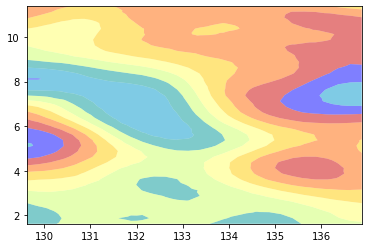

In [212]:
map_palau = folium.Map(location=[5.7, 133.5],
                    zoom_start = 6.5)
x_orig = np.asarray(df3.longitude.tolist())
y_orig = np.asarray(df3.latitude.tolist())
#z_orig = np.asarray(sample_cleaned.adt.tolist())
z_orig = np.asarray(df3.trend.tolist())

colors = ['#0000ff','#0099cc','#009999','#ccff66','#ffff66','#ffcc00','#ff6600','#cc0000']
x_arr          = np.linspace(np.min(x_orig), np.max(x_orig), 500)
y_arr          = np.linspace(np.min(y_orig), np.max(y_orig), 500)
x_mesh, y_mesh = np.meshgrid(x_arr, y_arr)
z_mesh = griddata((x_orig, y_orig), z_orig, (x_mesh, y_mesh), method='linear')
#sigma = [10, 10]
#z_mesh = sp.ndimage.filters.gaussian_filter(z_mesh, sigma, mode='constant')
levels = len(colors)
vmin   = min(trend_coord)
vmax   = max(trend_coord)
cm     = branca.colormap.LinearColormap(colors, vmin=vmin, vmax=vmax).to_step(levels)



contourf = plt.contourf(x_mesh, y_mesh, z_mesh, levels, alpha=0.5, colors=colors, linestyles='None',antialiased=True, vmin=vmin, vmax=vmax)

In [213]:
cm.caption = 'Trend (mm/year)'
map_palau.add_child(cm)

In [214]:
geojson = geojsoncontour.contourf_to_geojson(
    contourf=contourf,
    min_angle_deg=3.0,
    ndigits=5,
    stroke_width=1,
    fill_opacity=0.5)

cont = folium.GeoJson(
    geojson,
    style_function=lambda x: {
        'color':     x['properties']['stroke'],
        'weight':    x['properties']['stroke-width'],
        'fillColor': x['properties']['fill'],
        'opacity':   0.6,
    }).add_to(map_palau)


In [215]:
MousePosition().add_to(map_palau)


formatter = "function(num) {return L.Util.formatNum(num, 3) + ' º ';};"

MousePosition(
    position="topright",
    separator=" | ",
    empty_string="NaN",
    lng_first=True,
    num_digits=20,
    prefix="Coordinates:",
    lat_formatter=formatter,
    lng_formatter=formatter,
).add_to(map_palau)

In [197]:
map_palau

In [160]:
coordinates = coordinates[['latitude','longitude']]
coordinates = coordinates.drop_duplicates()


In [149]:
coordinates

,latitude,longitude
363688,1.625,129.625
363689,1.625,129.875
363690,1.625,130.125
363691,1.625,130.375
363692,1.625,130.625
...,...,...
407094,11.375,135.875
407095,11.375,136.125
407096,11.375,136.375
407097,11.375,136.625


In [216]:
map_palau.add_child(folium.GeoJson(data=(open("PACISLAND.geojson", "r", encoding="utf-8-sig")).read()))

In [217]:
f = open('palau.geojson',)
coastline_json = json.load(f)
style = {'fillColor': '#228B22', 'color': '#228B22', 'fill-opacity': 1, 'interactive':False}

coast = folium.GeoJson(
    coastline_json,style_function=lambda x:style).add_to(map_palau)

In [218]:
map_palau

In [221]:
for x in coordinates.values:
    filename = str(df3[(df3['latitude'] == x[0]) & (df3['longitude']==x[1])]["html_file"].values[0])    
    html="""
    <iframe src=\"""" + "./figures/altimetry_figures_all/" + filename + """\" width="850" height="400"  frameborder="0">    
    """
    
    popup = folium.Popup(folium.Html(html, script=True))
    folium.Rectangle([(x[0]-0.125, x[1]-0.125), (x[0]+0.125, x[1]+0.125)], fill = True,color = '#00000000', popup=popup).add_to(map_palau)

In [222]:
map_palau

In [223]:
map_palau.save("./test.html")

In [127]:
#rect = folium.Rectangle([(1.5, 129.5), (1.75, 129.75)], fill = True,color = '#ccff66', opacity = 1)
html="""
    <iframe src=\"""" + "./figures/altimetry_figures/fig0.html" + """\" width="850" height="400"  frameborder="0">    
    """
popup = folium.Popup(folium.Html(html, script=True))

folium.Rectangle([(1.5, 129.5), (1.75, 129.75)], fill = True,color = '#ccff66', opacity = 1, popup=popup).add_to(map_palau)

In [123]:
coordinates = sample_cleaned[['latitude','longitude']]
coordinates = coordinates.drop_duplicates()


In [167]:
coordinates

,latitude,longitude
363688,1.625,129.625
363689,1.625,129.875
363690,1.625,130.125
363691,1.625,130.375
363692,1.625,130.625
...,...,...
407094,11.375,135.875
407095,11.375,136.125
407096,11.375,136.375
407097,11.375,136.625


In [165]:
df3[(df3['latitude'] == 1.625) & (df3['longitude']==129.625)]["html_file"][0]

'fig0.html'

In [145]:
html="""
    <iframe src=\"""" + "./figures/altimetry_figures/fig0.html" + """\" width="850" height="400"  frameborder="0">    
    """
popup = folium.Popup(folium.Html(html, script=True))

In [174]:
map_palau = folium.Map(location=[5.7, 133.5],
                    zoom_start = 6.5)
for x in coordinates.values:
    filename = str(df3[(df3['latitude'] == x[0]) & (df3['longitude']==x[1])]["html_file"].values[0])    
    html="""
    <iframe src=\"""" + "./figures/altimetry_figures/" + filename + """\" width="850" height="400"  frameborder="0">    
    """
    
    popup = folium.Popup(folium.Html(html, script=True))
    folium.Rectangle([(x[0]-0.125, x[1]-0.125), (x[0]+0.125, x[1]+0.125)], fill = True,color = '#00000000', popup=popup).add_to(map_palau)

In [175]:
map_palau